In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install opencv-python

In [3]:
!pip -q install ultralytics grad-cam opencv-python
!apt-get -qq install ffmpeg -y



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 78.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 72.0 MB/s eta 0:00:00


In [4]:
pip install ultralytics

In [5]:
!pip -q install ultralytics opencv-python lap==0.5.12
!apt-get -qq install ffmpeg -y


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 65.3 MB/s eta 0:00:00


In [6]:
import cv2
import numpy as np
import os
import subprocess
import shutil
from ultralytics import YOLO
from IPython.display import display, Video


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [32]:
MODEL_PATH = "/content/drive/MyDrive/YOLO11L train dataset/best (2).pt"
VIDEO_PATH = "/content/drive/MyDrive/cctv.mp4/mall2.mp4"

OUTPUT_AVI = "/content/output_split_view.avi"
OUTPUT_MP4 = "/content/output_split_view_final.mp4"

SIDEBAR_WIDTH = 320

# Counting
MIN_FRAMES_TO_COUNT = 8
EXIT_TIMEOUT = 20

# ✅ Heatmap thickness tuning
HEATMAP_DECAY = 0.985        # slow fade
HEATMAP_INTENSITY = 50    # stronger heat
HEATMAP_RADIUS = 80         # ✅ thicker trail blob (increase more if needed)

# ✅ Gender confidence threshold
GENDER_CONF_TH = 0.55        # below this => Unknown

Load model / open video

In [33]:
model = YOLO(MODEL_PATH)

cap = cv2.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    raise FileNotFoundError(f"❌ Cannot open video: {VIDEO_PATH}")

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)
fps = int(fps) if fps and fps > 0 else 25

output_w = w + SIDEBAR_WIDTH
output_h = h

print("✅ Video:", w, "x", h, "FPS:", fps)

# stable writer for colab
fourcc = cv2.VideoWriter_fourcc(*"XVID")
writer = cv2.VideoWriter(OUTPUT_AVI, fourcc, fps, (output_w, output_h))
if not writer.isOpened():
    raise RuntimeError("❌ VideoWriter failed to open.")


✅ Video: 1920 x 1080 FPS: 25


heatmap set up

In [34]:
heatmap_accum = np.zeros((h, w), dtype=np.float32)

# ✅ thick gaussian blob
x = np.arange(0, 2 * HEATMAP_RADIUS + 1)
y = np.arange(0, 2 * HEATMAP_RADIUS + 1)
xx, yy = np.meshgrid(x, y)
cx0, cy0 = HEATMAP_RADIUS, HEATMAP_RADIUS

gaussian = np.exp(-((xx - cx0)**2 + (yy - cy0)**2) / (2*(HEATMAP_RADIUS/2.2)**2))
gaussian = gaussian / gaussian.max()


Main Processing Loop

In [35]:
frame_idx = 0
first_seen = {}
last_seen = {}
counted_entry = set()
counted_exit = set()

# ✅ Store final gender for each ID (stable)
id_gender_map = {}

# ✅ Allowed gender labels only
VALID_GENDERS = {"male", "female"}

print("✅ Processing...")

while True:
    ret, frame = cap.read()
    if not ret:
        break
    if frame is None:
        continue

    frame_idx += 1

    # ✅ Heatmap fade for trails
    heatmap_accum *= HEATMAP_DECAY

    results = model.track(
        frame,
        persist=True,
        tracker="bytetrack.yaml",
        conf=0.4,
        iou=0.5,
        verbose=False
    )

    current_visible_ids = set()
    current_frame_count = 0

    if results and results[0].boxes is not None and results[0].boxes.id is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        ids = results[0].boxes.id.cpu().numpy()
        classes = results[0].boxes.cls.cpu().numpy()
        confs = results[0].boxes.conf.cpu().numpy()  # ✅ confidence
        names = model.names

        current_frame_count = len(ids)

        for box, tid, cls, cconf in zip(boxes, ids, classes, confs):
            tid = int(tid)
            current_visible_ids.add(tid)

            # -------------------------------
            # ✅ GENDER LABEL SAFE LOGIC
            # -------------------------------
            cls_id = int(cls)
            pred_label = names[cls_id] if cls_id < len(names) else "unknown"
            pred_label = str(pred_label).strip().lower()

            # ✅ only accept male/female with good confidence
            if (pred_label in VALID_GENDERS) and (float(cconf) >= GENDER_CONF_TH):
                safe_gender = pred_label
            else:
                safe_gender = "unknown"

            # ✅ lock gender once stable
            # if already male/female, don't override with unknown later
            if tid not in id_gender_map:
                id_gender_map[tid] = safe_gender
            else:
                if id_gender_map[tid] == "unknown" and safe_gender in VALID_GENDERS:
                    id_gender_map[tid] = safe_gender

            # -------------------------------
            # Entry/Exit tracking
            # -------------------------------
            if tid not in first_seen:
                first_seen[tid] = frame_idx
            last_seen[tid] = frame_idx

            if tid not in counted_entry and (frame_idx - first_seen[tid] >= MIN_FRAMES_TO_COUNT):
                counted_entry.add(tid)

            # -------------------------------
            # Heatmap update (thick Gaussian)
            # -------------------------------
            x1, y1, x2, y2 = map(int, box)
            cx = (x1 + x2) // 2
            cy = y2

            cx = max(0, min(cx, w - 1))
            cy = max(0, min(cy, h - 1))

            x1g = max(cx - HEATMAP_RADIUS, 0)
            y1g = max(cy - HEATMAP_RADIUS, 0)
            x2g = min(cx + HEATMAP_RADIUS + 1, w)
            y2g = min(cy + HEATMAP_RADIUS + 1, h)

            gx1 = x1g - (cx - HEATMAP_RADIUS)
            gy1 = y1g - (cy - HEATMAP_RADIUS)
            gx2 = gx1 + (x2g - x1g)
            gy2 = gy1 + (y2g - y1g)

            heatmap_accum[y1g:y2g, x1g:x2g] += gaussian[gy1:gy2, gx1:gx2] * HEATMAP_INTENSITY

            # -------------------------------
            # Draw bounding boxes (fresh video)
            # -------------------------------
            gender_final = id_gender_map.get(tid, "unknown")

            if gender_final == "male":
                color = (0, 255, 0)
            elif gender_final == "female":
                color = (255, 100, 255)
            else:
                color = (200, 200, 200)

            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            cv2.putText(frame, f"ID:{tid} {gender_final.capitalize()}",
                        (x1, y1 - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)

    # EXIT logic
    for tid in list(counted_entry):
        if tid not in current_visible_ids and tid not in counted_exit:
            if frame_idx - last_seen.get(tid, 0) >= EXIT_TIMEOUT:
                counted_exit.add(tid)

    # ✅ Gender counts (unique stable IDs)
    males = len([g for g in id_gender_map.values() if g == "male"])
    females = len([g for g in id_gender_map.values() if g == "female"])
    unknowns = len([g for g in id_gender_map.values() if g == "unknown"])

    # ---------------------------------------
    # BUILD OUTPUT CANVAS
    # ---------------------------------------
    canvas = np.zeros((output_h, output_w, 3), dtype=np.uint8)
    canvas[0:h, 0:w] = frame

    sidebar_x = w
    canvas[:, sidebar_x:] = (40, 40, 40)

    # ---------------------------------------
    # ✅ HEATMAP BOX (BOTTOM RIGHT)
    # ---------------------------------------
    # Extra blur makes trails look thicker
    heat_blur = cv2.GaussianBlur(heatmap_accum, (61, 61), 0)

    heat_img = np.clip(heat_blur, 0, 255).astype(np.uint8)
    heat_colored = cv2.applyColorMap(heat_img, cv2.COLORMAP_JET)

    hm_pad = 20
    hm_box_w = SIDEBAR_WIDTH - hm_pad * 2
    hm_box_h = int(h * 0.32)

    heat_small = cv2.resize(heat_colored, (hm_box_w, hm_box_h))

    hm_x = sidebar_x + hm_pad
    hm_y = h - hm_box_h - 25

    cv2.rectangle(canvas, (hm_x - 2, hm_y - 2),
                  (hm_x + hm_box_w + 2, hm_y + hm_box_h + 2),
                  (0, 255, 255), 2)

    cv2.putText(canvas, "Heatmap View", (hm_x, hm_y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.65, (220, 220, 220), 2)

    canvas[hm_y:hm_y + hm_box_h, hm_x:hm_x + hm_box_w] = heat_small

    # ---------------------------------------
    # STATISTICS PANEL (TOP RIGHT)
    # ---------------------------------------
    x_pos = sidebar_x + 20
    y_pos = 50
    line_h = 32

    cv2.putText(canvas, "STATISTICS", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.85, (0, 255, 255), 2)
    y_pos += 45

    cv2.putText(canvas, f"Frame: {frame_idx}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1)
    y_pos += line_h

    cv2.putText(canvas, f"Current Count: {current_frame_count}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1)
    y_pos += line_h

    cv2.putText(canvas, f"Total Entered: {len(counted_entry)}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (100, 255, 100), 1)
    y_pos += line_h

    cv2.putText(canvas, f"Total Exited:  {len(counted_exit)}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (100, 100, 255), 1)
    y_pos += 35

    cv2.putText(canvas, f"Males: {males}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 1)
    y_pos += line_h

    cv2.putText(canvas, f"Females: {females}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 100, 255), 1)
    y_pos += line_h

    cv2.putText(canvas, f"Unknown: {unknowns}", (x_pos, y_pos),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (200, 200, 200), 1)

    # write frame
    writer.write(canvas)

cap.release()
writer.release()

print("✅ Done. AVI saved:", OUTPUT_AVI)


✅ Processing...
✅ Done. AVI saved: /content/output_split_view.avi


compressed Video

In [36]:
cmd = [
    "ffmpeg", "-y",
    "-i", OUTPUT_AVI,
    "-vcodec", "libx264",
    "-pix_fmt", "yuv420p",
    "-crf", "23",
    "-preset", "fast",
    OUTPUT_MP4
]

result = subprocess.run(cmd, capture_output=True, text=True)

if result.returncode != 0:
    print("❌ FFmpeg failed:")
    print(result.stderr)
else:
    print("✅ Output MP4:", OUTPUT_MP4)
    display(Video(OUTPUT_MP4, embed=True, width=900))


✅ Output MP4: /content/output_split_view_final.mp4


Vedio Analysis Dashboard

In [48]:
from collections import defaultdict
import numpy as np

stats = defaultdict(list)
zone_counts = {"LT":0, "RT":0, "LB":0, "RB":0}


In [51]:
# ------------------------------
# APPEND STATS (per frame)
# ------------------------------
stats["cur"].append(current_frame_count)
stats["in"].append(len(counted_entry))
stats["out"].append(len(counted_exit))
stats["det"].append(current_frame_count)

# ------------------------------
# Gender counts per frame (live)
# ------------------------------
genders_now = [str(id_gender_map.get(tid, "unknown")).lower() for tid in current_visible_ids]
stats["male"].append(sum(g == "male" for g in genders_now))
stats["female"].append(sum(g == "female" for g in genders_now))
stats["unk"].append(sum(g not in ("male", "female") for g in genders_now))

# ------------------------------
# Zone counting (4 zones)
# ------------------------------
if results and results[0].boxes is not None and results[0].boxes.xyxy is not None:
    for x1, y1, x2, y2 in results[0].boxes.xyxy.cpu().numpy().astype(int):
        cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
        zone_counts[("L" if cx < w//2 else "R") + ("T" if cy < h//2 else "B")] += 1


In [52]:
fps = cap.get(cv2.CAP_PROP_FPS)
fps = int(fps) if fps and fps > 0 else 25


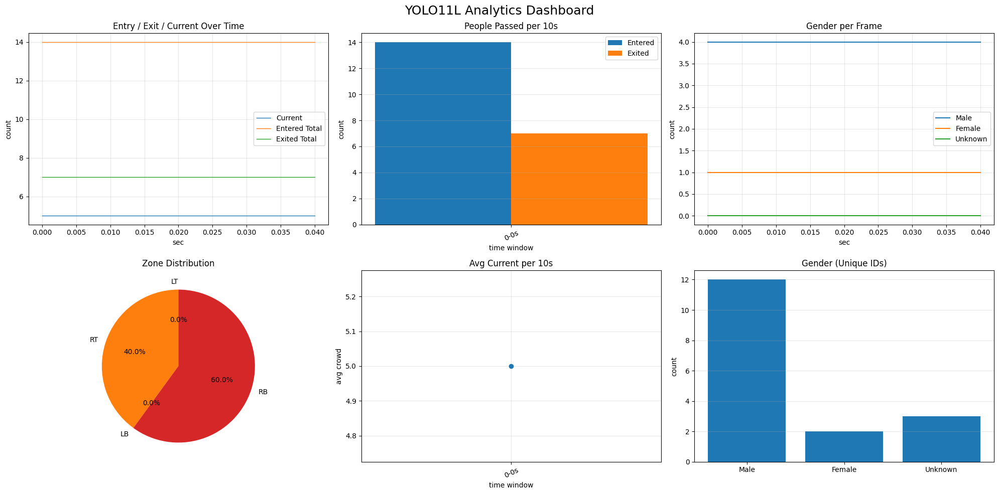

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# --- Safety ---
T = len(stats["cur"])
if T == 0:
    raise RuntimeError("No stats recorded. Your lists are empty.")

if fps is None or fps <= 0:
    fps = 25  # fallback

t = np.arange(T) / fps

# ✅ ENTER/EXIT frequency per frame (difference)
entered_freq = np.diff([0] + stats["in"])     # how many entered this frame
exited_freq  = np.diff([0] + stats["out"])    # how many exited this frame

# ✅ per 10 seconds bins
bin_sec = 10
bin_frames = int(bin_sec * fps)
bins = range(0, T, bin_frames)

bin_labels = [f"{i/fps:.0f}-{min(i+bin_frames,T)/fps:.0f}s" for i in bins]

entered_10s = [sum(entered_freq[i:min(i+bin_frames,T)]) for i in bins]
exited_10s  = [sum(exited_freq[i:min(i+bin_frames,T)]) for i in bins]
avg_current_10s = [np.mean(stats["cur"][i:min(i+bin_frames,T)]) for i in bins]

# ✅ unique gender totals
male_u = sum(str(v).lower()=="male" for v in id_gender_map.values())
female_u = sum(str(v).lower()=="female" for v in id_gender_map.values())
unk_u = len(id_gender_map) - male_u - female_u

# ✅ zone pie
zn = ["LT","RT","LB","RB"]
zv = [zone_counts[k] for k in zn]

# ---------------- Dashboard ----------------
plt.figure(figsize=(20,10))

# 1) Entry/Exit/Crowd over time (line)
plt.subplot(2,3,1)
plt.plot(t, stats["cur"], label="Current", linewidth=1)
plt.plot(t, stats["in"], label="Entered Total", linewidth=1)
plt.plot(t, stats["out"], label="Exited Total", linewidth=1)
plt.title("Entry / Exit / Current Over Time")
plt.xlabel("sec"); plt.ylabel("count")
plt.grid(alpha=.3); plt.legend()

# 2) ✅ People Passed per 10s (bar)
plt.subplot(2,3,2)
x = np.arange(len(bin_labels))
plt.bar(x-0.2, entered_10s, width=0.4, label="Entered")
plt.bar(x+0.2, exited_10s,  width=0.4, label="Exited")
plt.xticks(x, bin_labels, rotation=25)
plt.title("People Passed per 10s")
plt.xlabel("time window"); plt.ylabel("count")
plt.grid(axis="y", alpha=.3); plt.legend()

# 3) Gender per frame (live)
plt.subplot(2,3,3)
plt.plot(t, stats["male"], label="Male")
plt.plot(t, stats["female"], label="Female")
plt.plot(t, stats["unk"], label="Unknown")
plt.title("Gender per Frame")
plt.xlabel("sec"); plt.ylabel("count")
plt.grid(alpha=.3); plt.legend()

# 4) Zone distribution pie
plt.subplot(2,3,4)
if sum(zv)>0:
    plt.pie(zv, labels=zn, autopct="%1.1f%%", startangle=90)
else:
    plt.text(.5,.5,"No zone data",ha="center",va="center")
plt.title("Zone Distribution")

# 5) Average current per 10s (line)
plt.subplot(2,3,5)
plt.plot(bin_labels, avg_current_10s, marker="o")
plt.title("Avg Current per 10s")
plt.xlabel("time window"); plt.ylabel("avg crowd")
plt.xticks(rotation=25)
plt.grid(alpha=.3)

# 6) Gender unique IDs (bar)
plt.subplot(2,3,6)
plt.bar(["Male","Female","Unknown"], [male_u,female_u,unk_u])
plt.title("Gender (Unique IDs)")
plt.ylabel("count")
plt.grid(axis="y", alpha=.3)

plt.suptitle("YOLO11L Analytics Dashboard", fontsize=18)
plt.tight_layout()
plt.show()
